## Introduction to Spark Essentials

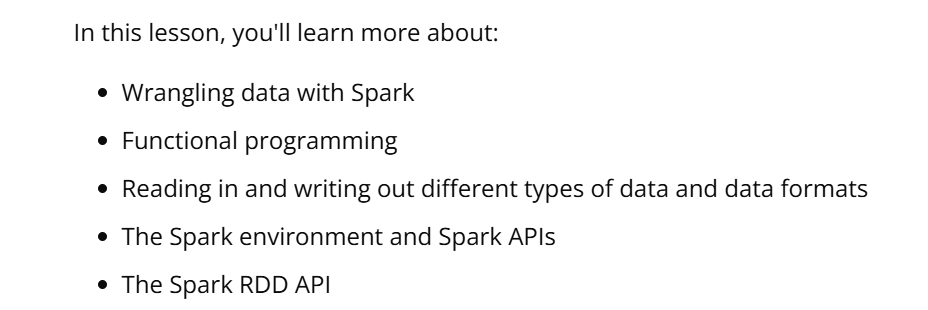

https://www.youtube.com/watch?v=CJ8rM5cN_X8

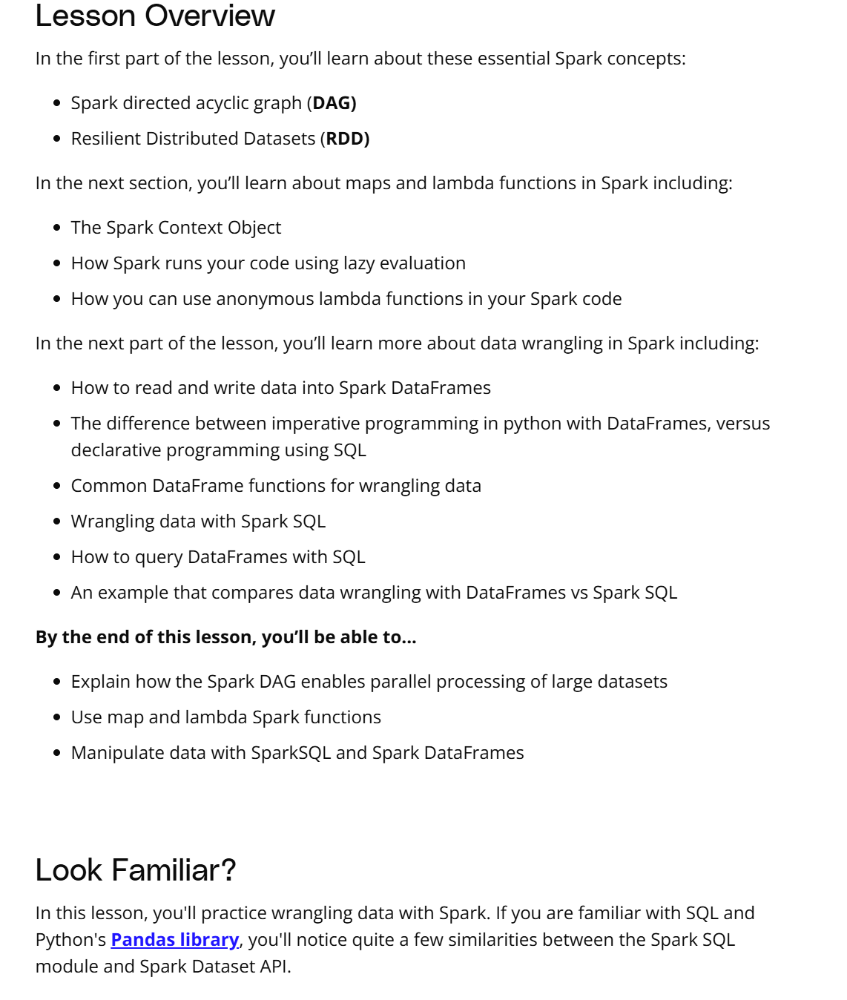

## The Spark DAG: Teamwork for Data Processing

The Spark DAG

Apache Spark distributes data processing tasks over a cluster of distributed computing resources. How does it accomplish this?

https://www.youtube.com/watch?v=SO3vgkuFfTg

## Cycling Team
Imagine a team of road cyclists, who share their water with each other to reduce the load of the person cycling in the front. Each time the lead cyclist rotates to the back, they take the duty of carrying the new lead cyclist's water. This works great, until they become separated.

If the lead cyclist is separated from their team, they won't have any water. For the lead cyclist to have adequate water, they must carry their own water. Similarly, in distributed systems, your program shouldn't rely on resources created by previous executions.

An idempotent program can run multiple times without any effect on the result. Some programs depend on prior state in order to execute properly. This is not considered idempotent, because they depend on that state existing before starting.

In [ ]:
 ## Example of relying on prior state

ledgerBalance = getLedgerBalanceFromLastRun()
ledgerBalance = ledgerBalance + getLedgerBalanceSinceLastRun()


## Example of avoiding prior state

ledgerBalance = addAllTransactions()

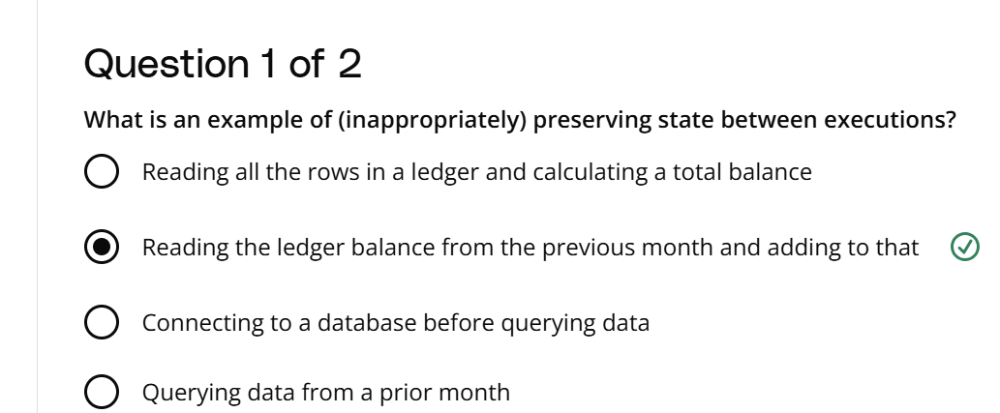

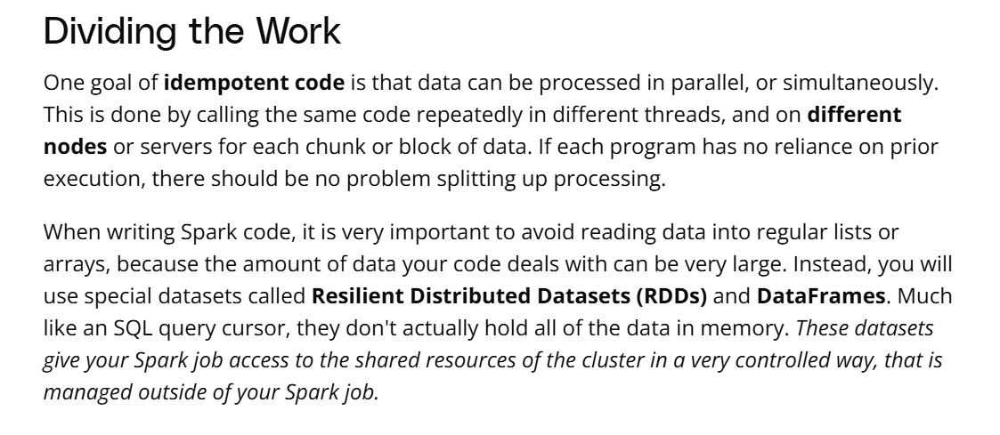

In [ ]:
## Instead of doing something like this 

textFile = open("invoices.txt", "r")

## invoiceList could occupy Gigabytes of Memory
invoiceList = textFile.readlines()

print(invoiceList)

## Do something like this instead

invoiceDataFrame = spark.read.text("invoices.txt")

## Leverage Spark DataFrames to handle large datasets
invoiceDataFrame.show(n=10)

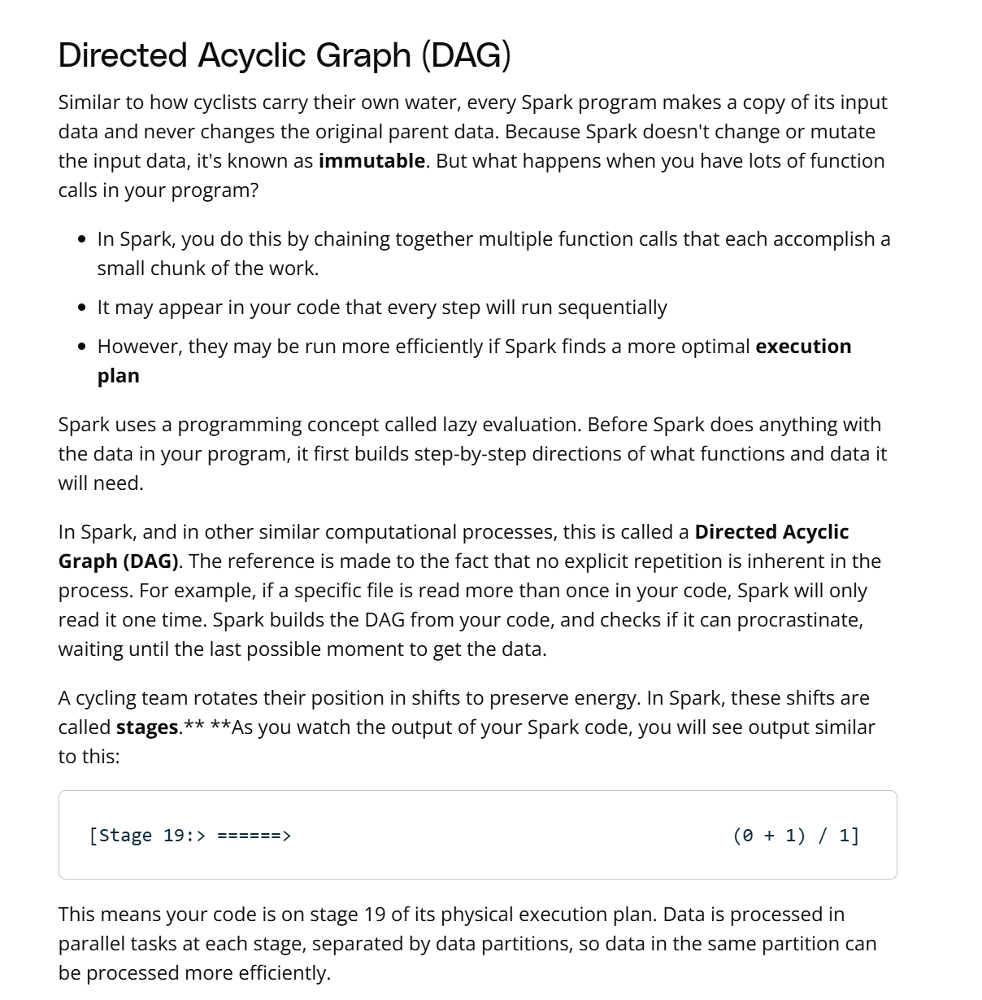

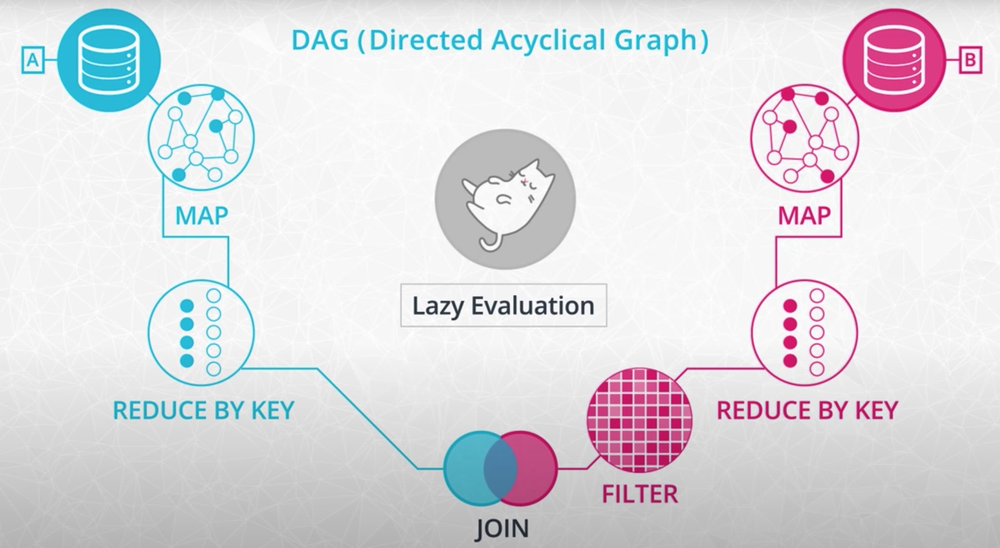

Lazy evaluation in the Spark DAG

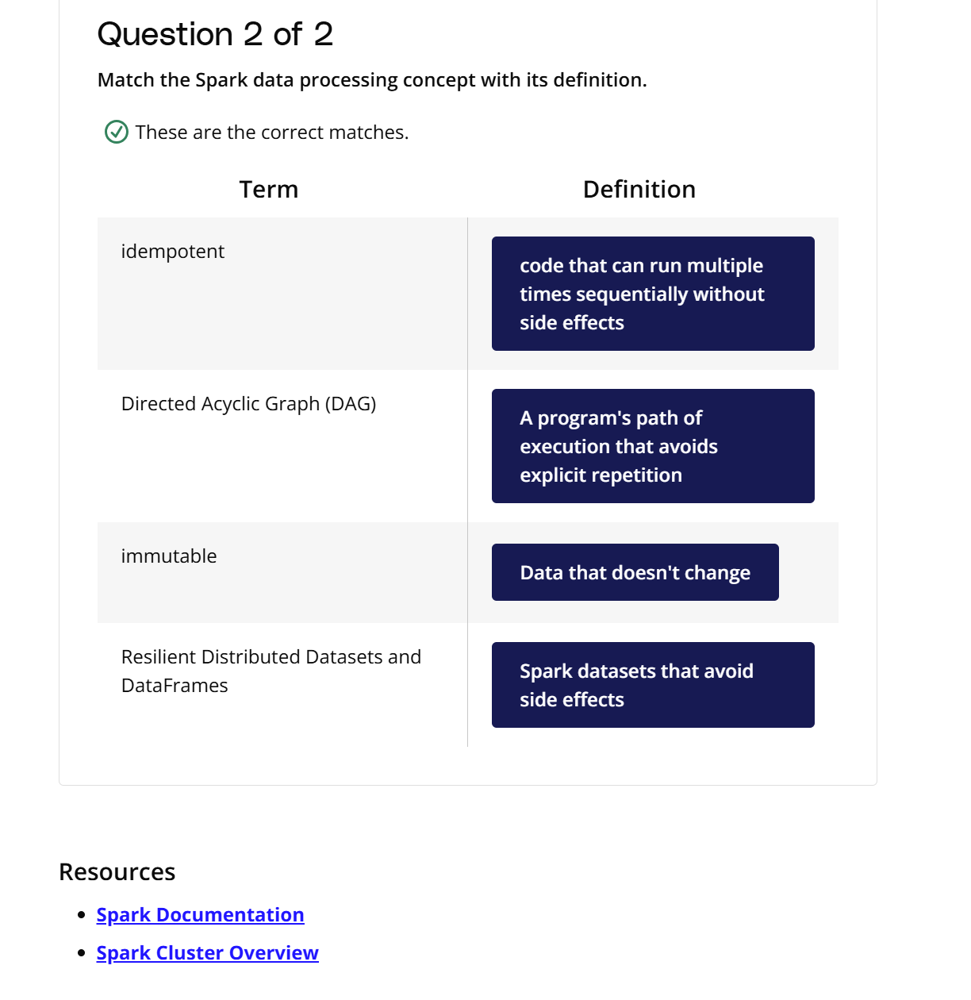

https://spark.apache.org/docs/latest/

https://spark.apache.org/docs/3.0.2/cluster-overview.html

## Resilient Distributed Datasets (RDDs)

Spark processes data using a cluster of distributed computing resources. Source data is loaded from a database, CSV files, JSON files, or text files. Spark converts this data into an immutable collection of objects for distributed processing called a Resilent Distributed Dataset or RDD. The features of the RDD are designed for efficient data processing; it is fault-tolerant (recomputed in case of failure), cacheable, and partitioned.

https://www.youtube.com/watch?v=8mhZD7rXQEY

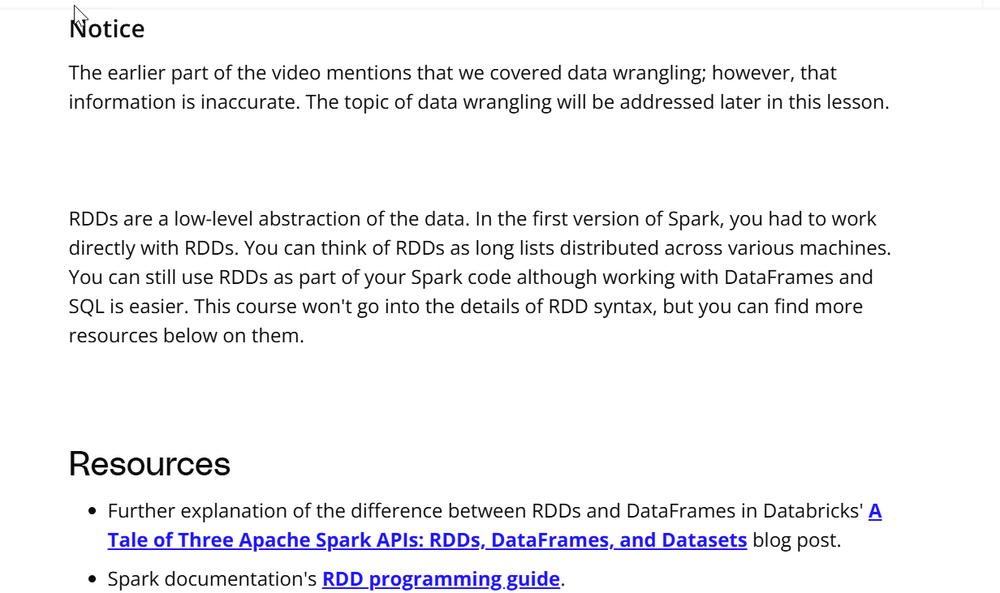

https://databricks.com/blog/2016/07/14/a-tale-of-three-apache-spark-apis-rdds-dataframes-and-datasets.html

https://spark.apache.org/docs/latest/rdd-programming-guide.html

## PySpark and SparkSession

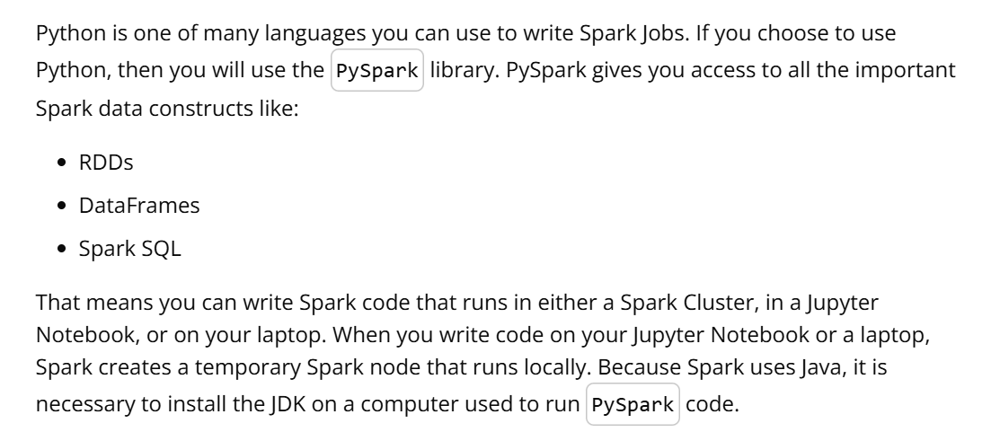

https://www.youtube.com/watch?v=ZMSzkDG1BSQ

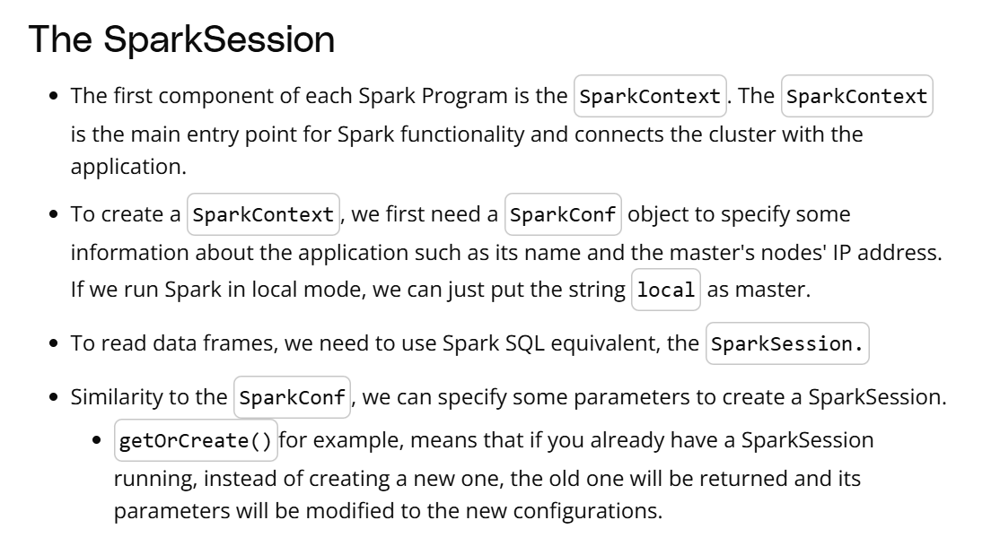

## Maps and Lambda Functions

One of the most common functions in Spark is map. It simply makes a copy of the original input data and transforms that copy according to whatever function you pass to map. You can think of it as directions for the data telling each input how to get to the output.



https://www.youtube.com/watch?v=4HZ6tEBoxAo

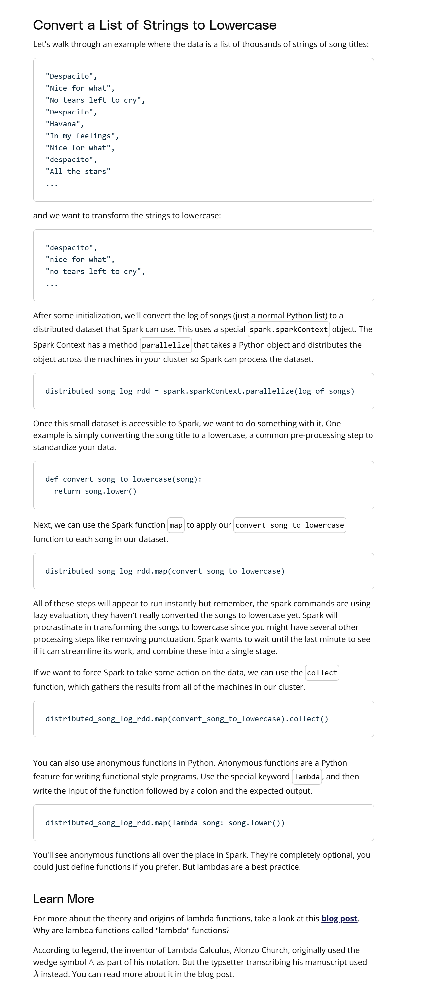

http://palmstroem.blogspot.com/2012/05/lambda-calculus-for-absolute-dummies.html

## Exercise: Maps and Lambda Functions

In [4]:
from pyspark import SparkContext

Exercise and Practice Repository

You can find the starter code and solutions to the practice scripts and exercises in Github here(opens in a new tab), as well as downloading them from the workspaces using the right-click menu and choosing Download

https://github.com/udacity/nd027-Data-Engineering-Data-Lakes-AWS-Exercises

## Solution: Maps and Lambda Functions Practice

https://www.youtube.com/watch?v=rn26bIIhmYU

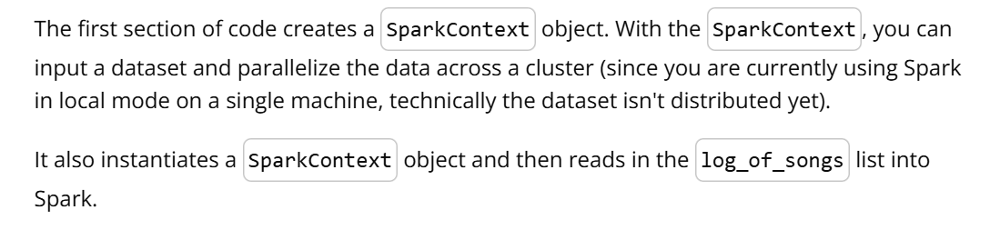

In [ ]:
import pyspark
sc = pyspark.SparkContext(appName="maps_and_lazy_evaluation_example")

log_of_songs = [
        "Despacito",
        "Nice for what",
        "No tears left to cry",
        "Despacito",
        "Havana",
        "In my feelings",
        "Nice for what",
        "despacito",
        "All the stars"
]

# parallelize the log_of_songs to use with Spark
distributed_song_log_rdd = sc.parallelize(log_of_songs)

The next code section defines a function that converts a song title to lowercase. Then there is an example transforming the word "Havana" to "havana".

In [ ]:
def convert_song_to_lowercase(song):
    return song.lower()

convert_song_to_lowercase("Havana")

The following code demonstrates how to apply this function using a map step. The map step will go through each song in the list and apply the convert_song_to_lowercase() function.

In [ ]:
distributed_song_log.map(convert_song_to_lowercase)

You may notice that this code runs quickly. This is because of lazy evaluation. Spark does not actually execute the map step unless it needs to.

"RDD" in the output refers to resilient distributed dataset. RDDs are exactly what they say they are: fault-tolerant datasets distributed across a cluster. This is how Spark stores data.

To get Spark to actually run the map step, you need to use an "action". One available action is the collect method. The collect() method takes the results from all of the clusters and "collects" them into a single list on the master node.

In [ ]:
distributed_song_log_rdd.map(convert_song_to_lowercase).collect()

Note as well that Spark does not change the original data set: Spark merely makes a copy. You can see this by running collect() on the original dataset.

In [ ]:
distributed_song_log_rdd.collect()

You do not always have to write a custom function for the map step. You can also use anonymous (lambda) functions as well as built-in Python functions like string.lower().

In [ ]:
distributed_song_log_rdd.map(lambda song: song.lower()).collect()
distributed_song_log_rdd.map(lambda x: x.lower()).collect()

## Data Formats

https://www.youtube.com/watch?v=y-EE91w7Kf0

The most common data formats you might come across are CSV, JSON, HTML, and XML.

A CSV file, or comma-separated values file, stores tabular data in index format. Each line represents a record where fields are always in the same order defined usually by the first header. As the name suggests, the records are separated with a comma:

Name       , Address .   , City       , State, Zip
Andrea Cruz, 123 Main St., Idaho Falls, ID   , 83404
Lamh Huynh , 456 Elm St. , Santa Cruz , CA   , 95063  

JSON or JavaScript object notation storage records in attribute-value pairs. The values may contain simple often numeric types or arrays:

{
"Name":"Andrea Cruz",
"Address":"123 Main St.",
"City":"Idaho Falls",
"State":"ID",
"Zip":"83404"
},
{
"Name":"Lamh Huynh",
"Address":"456 Elm St.",
"City":"Santa Cruz",
"State":"CA",
"Zip":"95063"
}

HTML or hypertext markup language is a standard language for creating web pages and applications. If you scrape data from the Internet, you will need to parse HTML:

In [ ]:
<!DOCTYPE html>
<html lang="en">
<div style="height: 90px">
<head>
    <meta charset="UTF-8">
    <title>STEDI Login Page</title>
    <link href="style.css" rel="stylesheet" type="text/css" />
    <link rel="shortcut icon" href= "favicon.ico" type="image/x-icon" />
</head>
<body>
<div class="page-header">
    <p><img src="stedi-logo-4000px-x-4000px.png" width="200" height="200" style="background-color:black;"/></p>
</div>
<div style="text-align:center">

    <form name="loginForm" id="login" method="post" >
        <p>
            <labelfor="username">Email Address</label><br>
            <input type="text" id="username" name="username" size="25">
        </p>
    </form>
</div>
</body>
</div>
</html>

## Distributed Data Stores

When we have so much data that we need distributed computing, the data itself often needs to be stored in a distributed way.

https://www.youtube.com/watch?v=DYAErjfPONE

Distributed file systems, storage services, and distributed databases store data in a fault-tolerant way. So if a machine breaks or becomes unavailable, we don't lose the information we have collected.

Hadoop has a Distributed File System, HDFS, to store data. HDFS splits files into 64 or 128 megabyte blocks and replicates these blocks across the cluster. This way, the data is stored in a fault-tolerant way and can be accessed in digestible chunks.

In the classroom workspaces and if you installed Spark on your local machine, Spark simulates a distributed file store. If you are working on a project or in a company that runs its own cluster resources, they might use HDFS.

If you're working on the cloud, you can use a distributed data storage service on a cloud provider. Examples of distributed data services on cloud providers include:

https://aws.amazon.com/s3/

https://azure.microsoft.com/en-us/services/storage/blobs/#overview

https://cloud.google.com/storage

Learn More

You can find more information about HDFS(opens in a new tab) here.

https://hadoop.apache.org/docs/r1.2.1/hdfs_design.html

## Imperative vs Declarative programming

https://www.youtube.com/watch?v=gGIZvUu4H9U

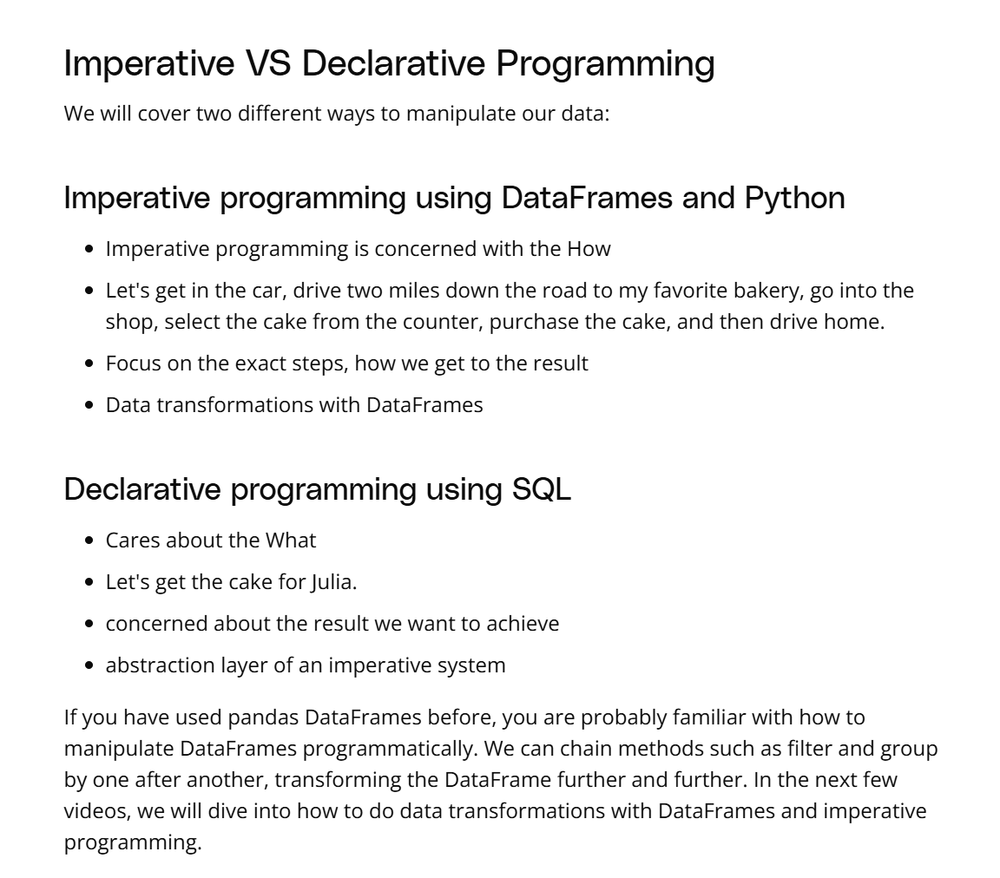

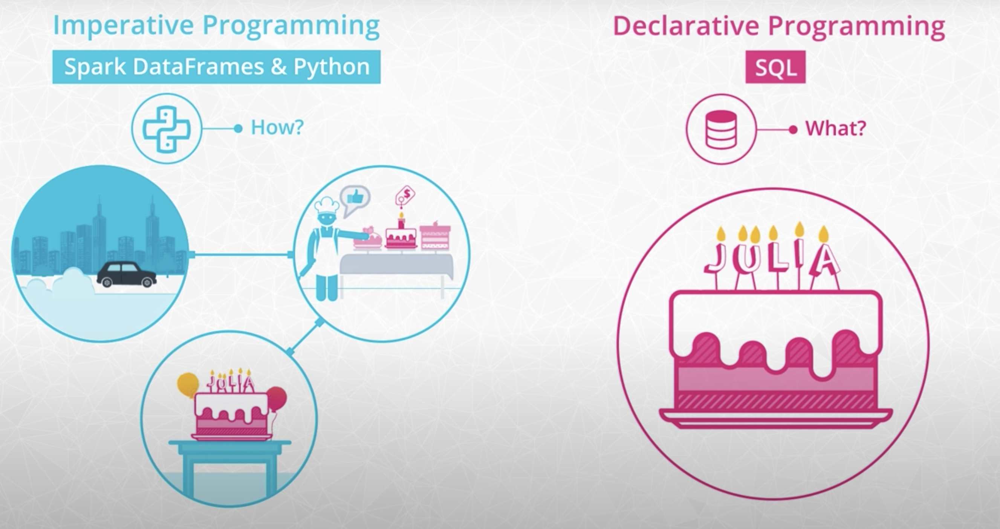

Imperative vs Declarative programming paradigms

## Exercise: Reading and Writing Data into Spark DataFrames

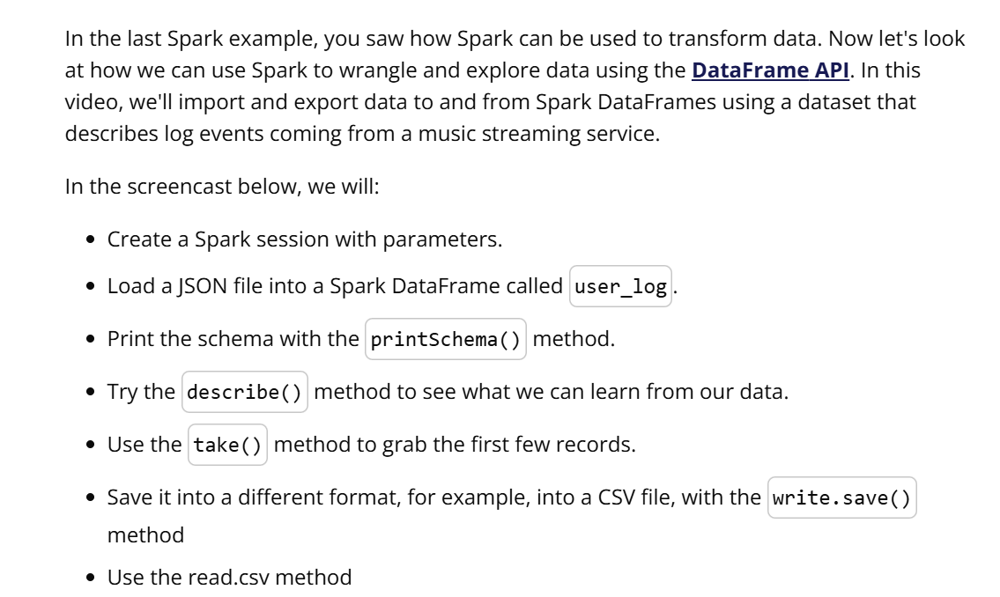

https://spark.apache.org/docs/latest/sql-programming-guide.html

https://www.youtube.com/watch?v=DR49NVl8HBM

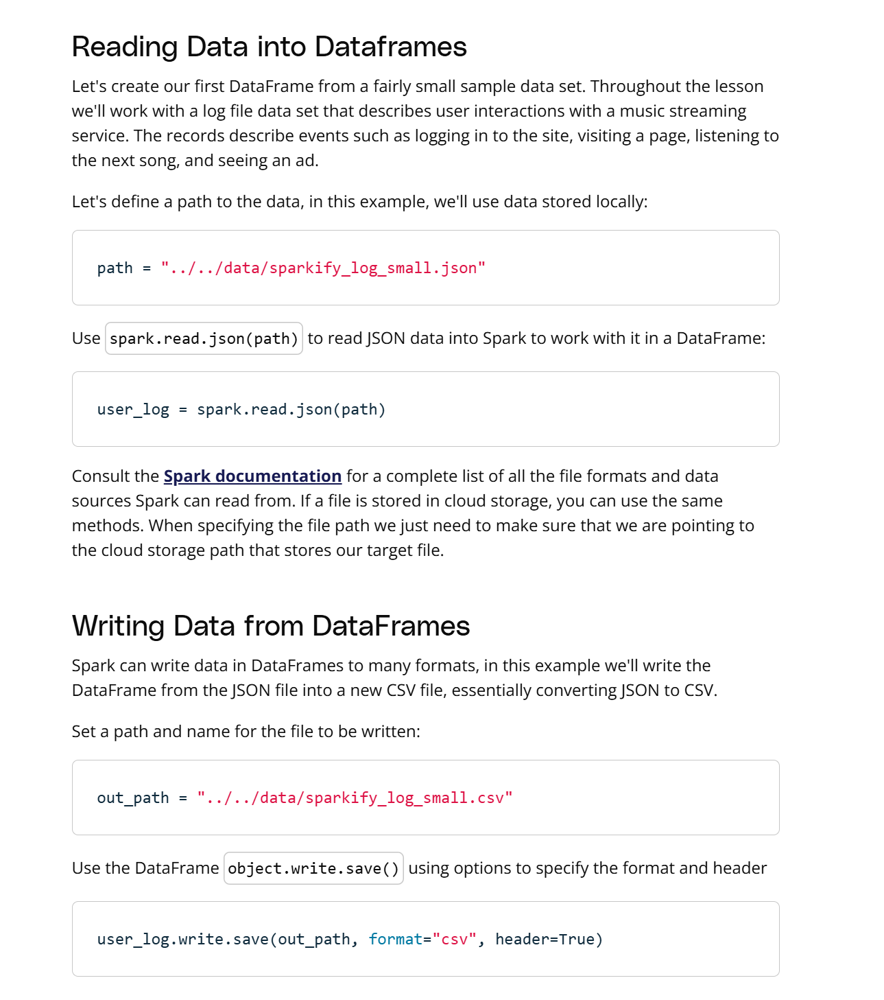

https://spark.apache.org/docs/latest/sql-data-sources-load-save-functions.html

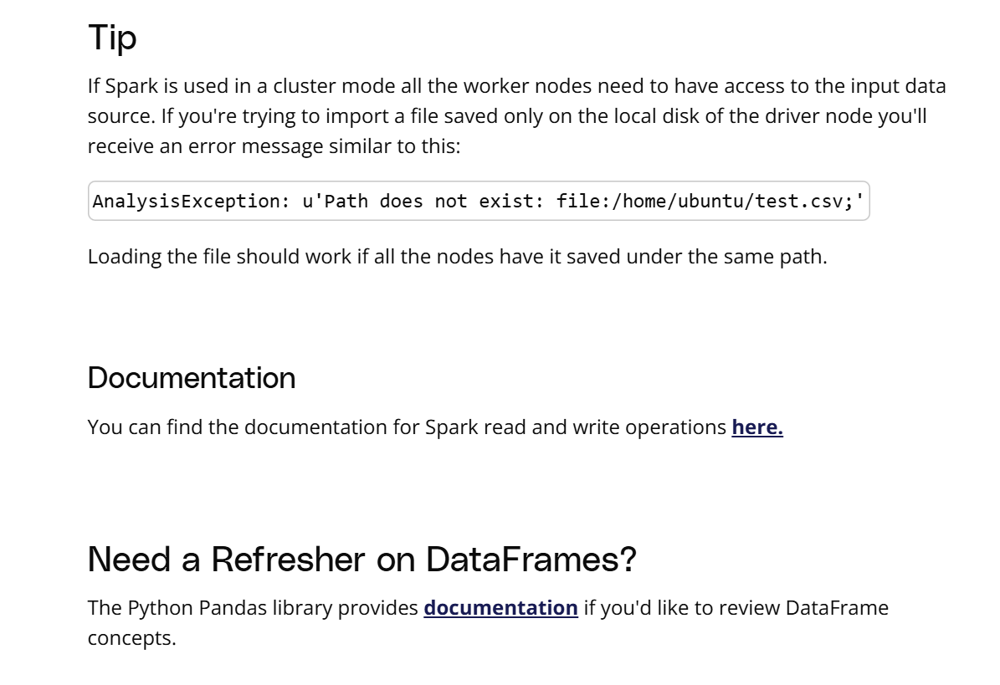

https://spark.apache.org/docs/latest/sql-data-sources-load-save-functions.html

https://pandas.pydata.org/docs/getting_started/intro_tutorials/01_table_oriented.html

## Data Wrangling with DataFrames

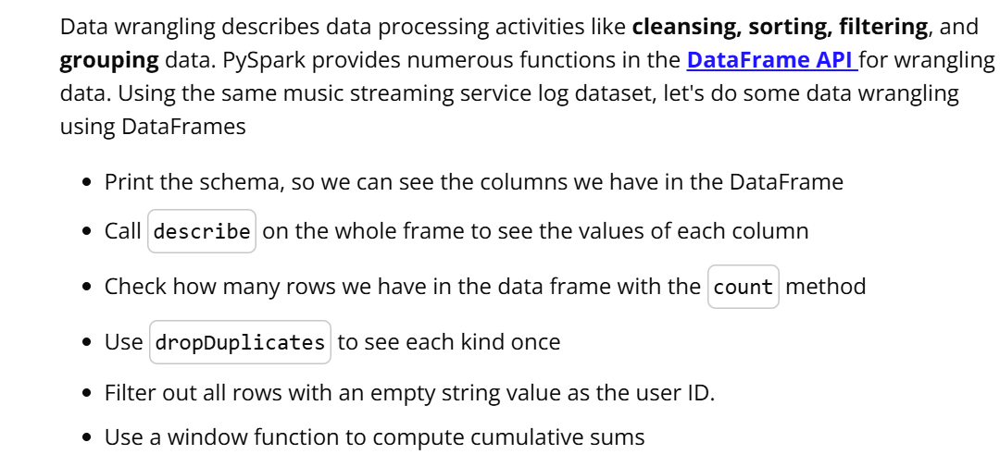

https://spark.apache.org/docs/3.1.1/api/python/reference/pyspark.sql.html#dataframe-apis

https://www.youtube.com/watch?v=p7YrwF72gQs

## Data Wrangling User Logs
This first section imports libraries, instantiates a SparkSession, and then reads in the data set

In [ ]:
from pyspark.sql import SparkSession
from pyspark.sql.functions import udf
from pyspark.sql.types import StringType
from pyspark.sql.types import IntegerType
from pyspark.sql.functions import desc
from pyspark.sql.functions import asc
from pyspark.sql.functions import sum as Fsum

import datetime

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
spark = SparkSession \
    .builder \
    .appName("Wrangling Data") \
    .getOrCreate()
path = "../../data/sparkify_log_small.json"
user_log = spark.read.json(path)

## Data Exploration
Let's explore the data by inspecting the first 5 rows in the DataFrame with the .take() function

In [ ]:
user_log.take(5)

Print the schema with .printSchema()

In [ ]:
user_log.printSchema()

Which displays the schema including column names and data types:

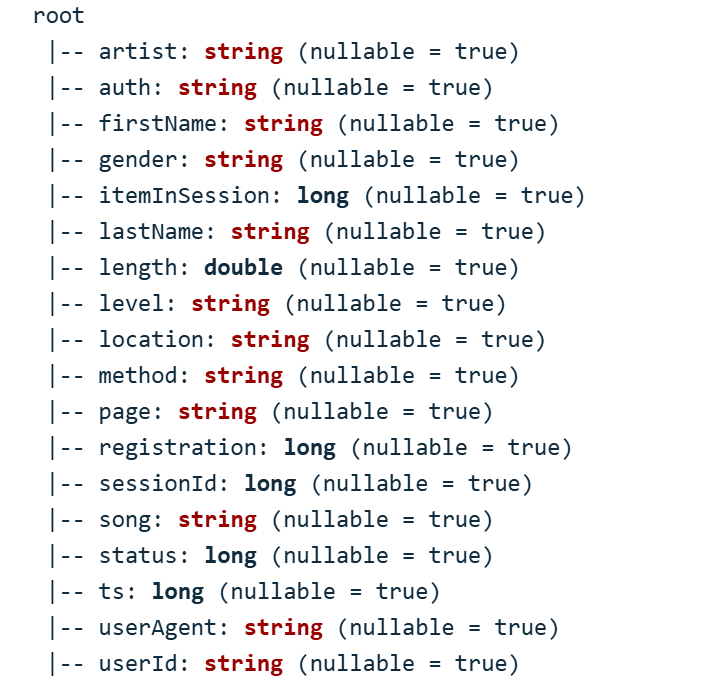

Display a DataFrame in a table format with the .show() function.

In [ ]:
user_log.describe().show()

Use the .describe() function with the .show() function to explore basic statistics about the data.

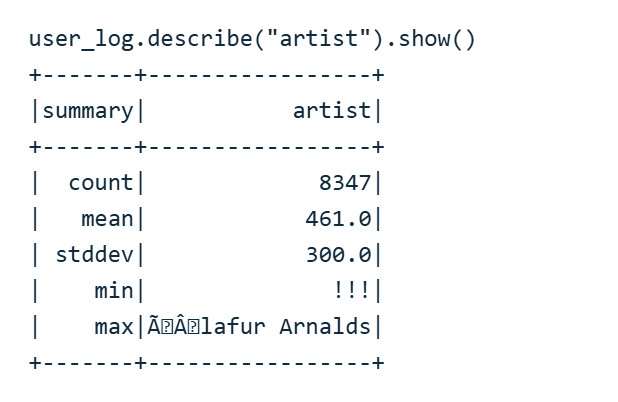

Use .dropDuplicates() to see each kind of page once, and sort by page

In [ ]:
user_log.select("page").dropDuplicates().sort("page").show()

In [ ]:
Select data for all pages where userId is 1046

In [ ]:
user_log_df.select(["userId", "firstname", "page", "song"]) .where(user_log_df.userId == "1046").show()

## Calculating Statistics by Hour
Display the results in a scatter plot

In [ ]:
get_hour = udf(lambda x: datetime.datetime.fromtimestamp(x / 1000.0).hour)
user_log = user_log.withColumn("hour", get_hour(user_log.ts))
user_log.head()
songs_in_hour = user_log.filter(user_log.page == "NextSong").groupby(user_log.hour).count().orderBy(user_log.hour.cast("float"))
songs_in_hour.show()
songs_in_hour_pd = songs_in_hour.toPandas()
songs_in_hour_pd.hour = pd.to_numeric(songs_in_hour_pd.hour)
plt.scatter(songs_in_hour_pd["hour"], songs_in_hour_pd["count"])
plt.xlim(-1, 24)
plt.ylim(0, 1.2 * max(songs_in_hour_pd["count"]))
plt.xlabel("Hour")
plt.ylabel("Songs played")

## Drop Rows with Missing Values
As you'll see, there are no missing values in the userId or sessionId columns. But there are userId values that are empty strings.

In [ ]:
user_log_valid = user_log.dropna(how = "any", subset = ["userId", "sessionId"])
user_log_valid.count()
user_log.select("userId").dropDuplicates().sort("userId").show()
user_log_valid = user_log_valid.filter(user_log_valid["userId"] != "")
user_log_valid.count()

## Users Downgrade Their Accounts
Find when users downgrade their accounts and then flag those log entries. Then use a window function and cumulative sum to distinguish each user's data as either pre or post-downgrade events.

In [ ]:
user_log_valid.filter("page = 'Submit Downgrade'").show()
user_log.select(["userId", "firstname", "page", "level", "song"]).where(user_log.userId == "1138").collect()
flag_downgrade_event = udf(lambda x: 1 if x == "Submit Downgrade" else 0, IntegerType())
user_log_valid = user_log_valid.withColumn("downgraded", flag_downgrade_event("page"))
user_log_valid.head()
from pyspark.sql import Window
windowval = Window.partitionBy("userId").orderBy(desc("ts")).rangeBetween(Window.unboundedPreceding, 0)
user_log_valid = user_log_valid.withColumn("phase", Fsum("downgraded").over(windowval))
user_log_valid.select(["userId", "firstname", "ts", "page", "level", "phase"]).where(user_log.userId == "1138").sort("ts").collect()

## Exercise: Wrangling with DataFrames

## Practice: Data Wrangling with Spark
Use the workspace below to explore the user logs with DataFrames and wrangle data. Run the code and study the output.

## Data Wrangling Quiz

## Quiz
Answer these quiz questions using the workspace below along with the "sparkify_log_small.json" file you can find in the workspace or the Github repository(opens in a new tab). You'll need to wrangle the data yourself to find the answers.

A solution can be found on the next page.

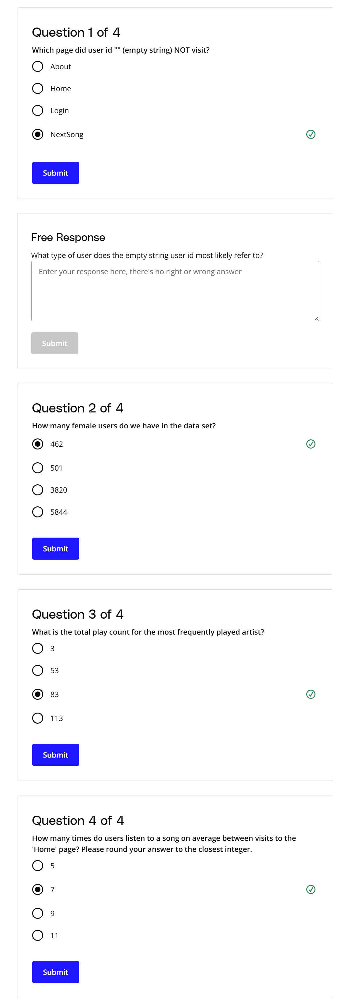

## Solution: Data Wrangling Quiz

How did you do? Find a walkthrough of a possible solution below, along with a workspace for you to try it yourself.

https://www.youtube.com/watch?v=XQHeQcvjopg

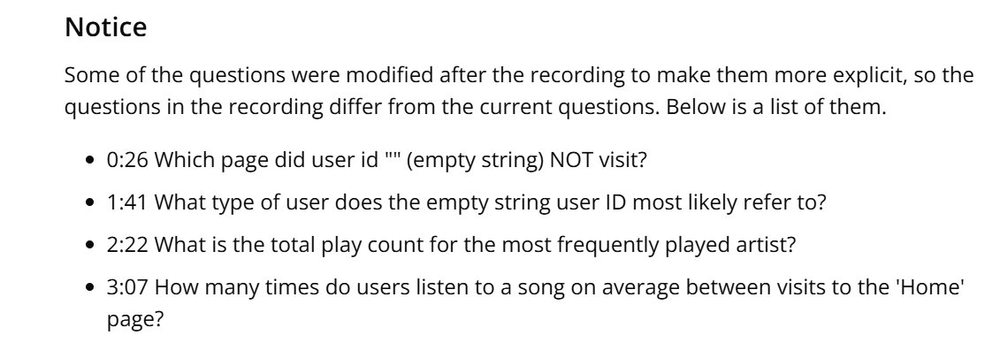

## Data Wrangling with DataFrames Extra Tips

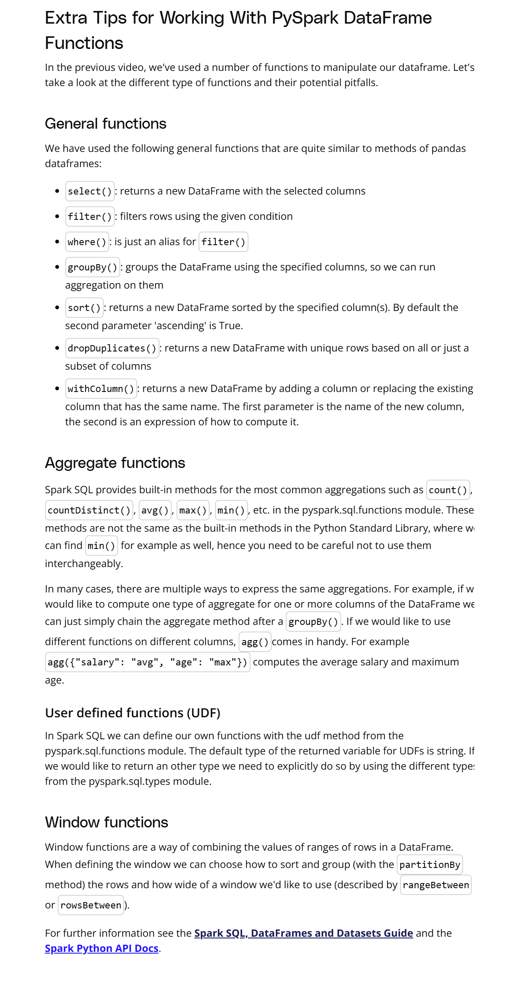

https://spark.apache.org/docs/latest/sql-programming-guide.html

https://spark.apache.org/docs/latest/api/python/index.html

## Spark SQL

Next, you'll learn to query data with a declarative approach. Spark comes with a SQL library that lets you query DataFrames using the same SQL syntax you'd use in a tool like MySQL or Postgres.

https://www.youtube.com/watch?v=0Iv5SdKf-u0

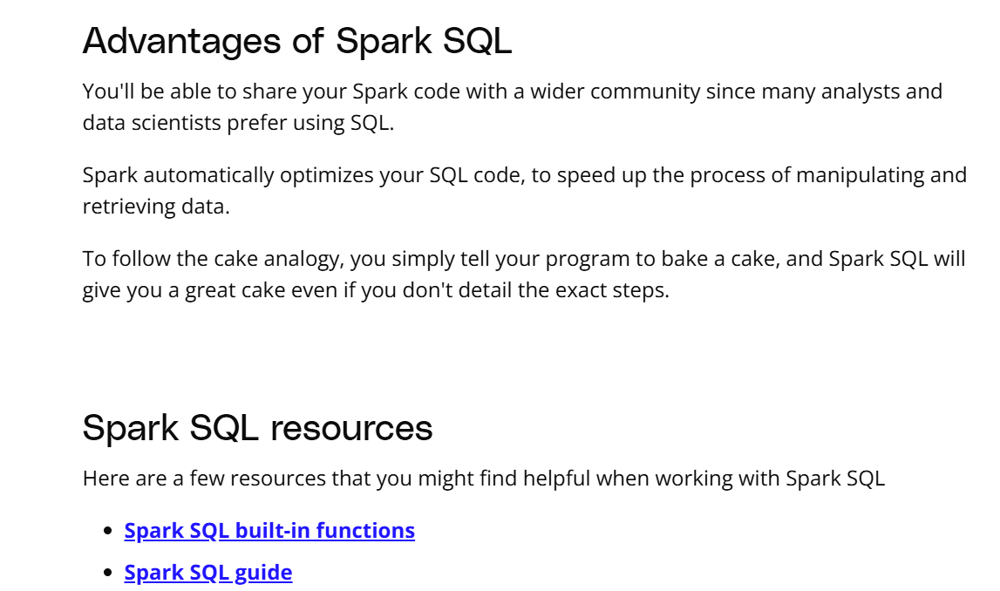

https://spark.apache.org/docs/latest/api/sql/index.html

https://spark.apache.org/docs/latest/sql-getting-started.html

## Spark SQL Example

## Data Wrangling with Spark SQL
Using the same music streaming service log dataset, let's do the same data wrangling we performed with DataFrames, but this time we'll use a declarative approach with SQL. Use the workspace below and run the code to observe how the output is the same, but the tasks are written in SQL.

https://www.youtube.com/watch?v=osf6KKAf2ko

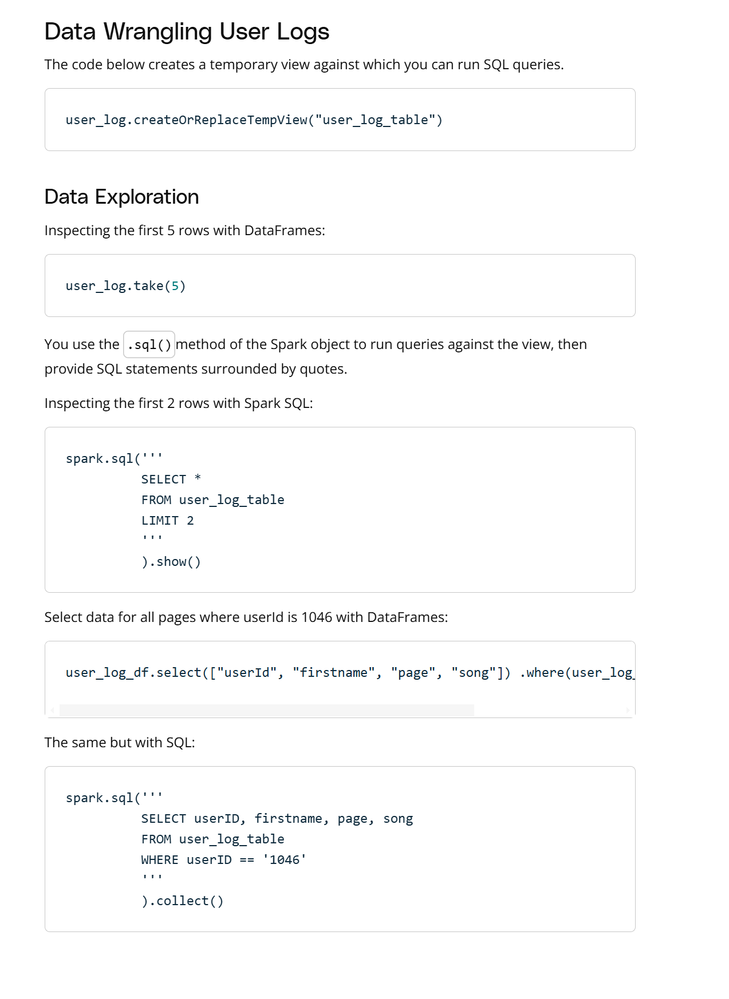

In [ ]:
user_log_df.select(["userId", "firstname", "page", "song"]) .where(user_log_df.userId == "1046").show()